In [1]:
import torch
import numpy as np
import pandas as pd
import pickle
# import statistics
from sklearn.metrics import classification_report, accuracy_score, f1_score, precision_score, recall_score
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import significantdigits as sd
from significantdigits import Error
import re
import json
# from matplotlib.lines import Line2D
# import nibabel as nib
# from nilearn import plotting
# from matplotlib.colors import LinearSegmentedColormap
# import plotly.graph_objects as go
# import plotly.express as px
# from plotly.subplots import make_subplots
# from datetime import datetime, timedelta
from pathlib import Path
from itertools import product
import transformers
import significantdigits as sd
from significantdigits import Error
from collections import defaultdict
from itertools import product
import os


/home/ine5/projects/rrg-glatard/ine5/venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## TO DO
* Binary output for SR is completed and is 100% stable across Verrou and Fuzzy PyTorch
* Look into embeddings and pre-argmax output -- note why is argmax working here but not in Fastsurfer? Something related to Tristan's theory on non-int values?
* Compute runtimes differences for Verrou, Fuzzy Pytorch and IEEE

## Intermediate Model Output

WavLM --> ECAPA TDNN --> Classifier --> Argmax \
WavLM is a transformer encoder that begins with a CNN encoder 
* What are last_hidden_state and extract_features?
* Only using last_hidden_state

ECAPA TDNN is a CNN


Classifier is composed of a single linear layer


Subject: 5392123
Significant digits output: [5.07610245 5.03731345], Significant digits embeddings mean: 3.9530133082221837 stdev: 0.49280000217213377

Subject: 5404003


Significant digits output: [5.31466308 5.82141431], Significant digits embeddings mean: 3.9566954201763953 stdev: 0.29905989524338034

Subject: 5413955
Significant digits output: [5.39886529 5.47654964], Significant digits embeddings mean: 4.006897936226831 stdev: 0.40766717404181824

Subject: 5517206
Significant digits output: [4.51463248 4.32763998], Significant digits embeddings mean: 3.7665137608113533 stdev: 0.4180940013330314

Subject: 5560423
Significant digits output: [5.4543725  5.52038432], Significant digits embeddings mean: 3.9601913697965045 stdev: 0.39224028760711044

Subject: 5670343
Significant digits output: [3.96292746 3.74777228], Significant digits embeddings mean: 3.603581489212822 stdev: 0.6002143552546337

Subject: 5740731
Significant digits output: [5.61569307 5.7372121 ], Significant digits embeddings mean: 3.8630620917892102 stdev: 0.28034014414944775

Subject: 5816608
Significant digits output: [4.5549031 4.4306122], Significant digits embeddings mean: 3.7634

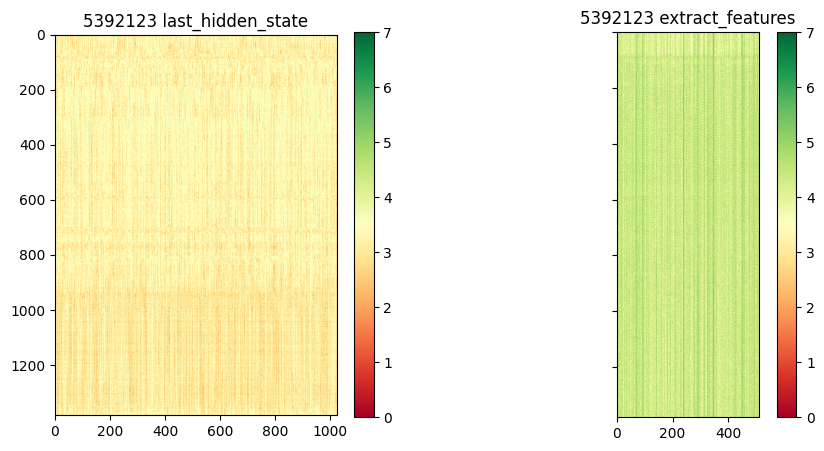

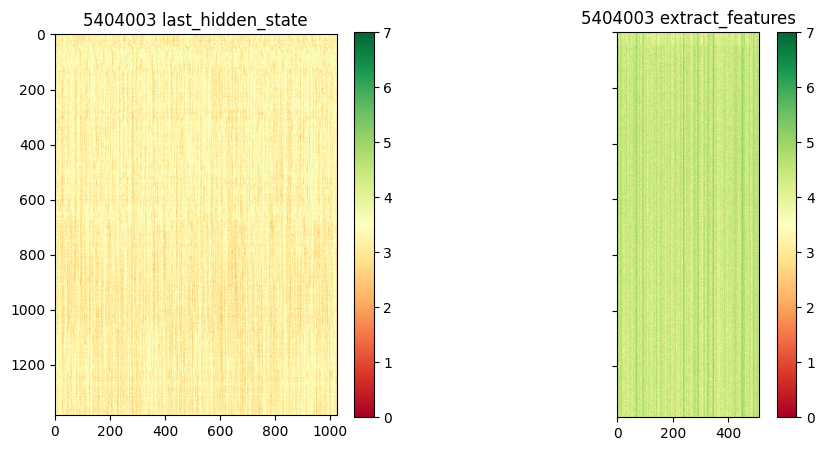

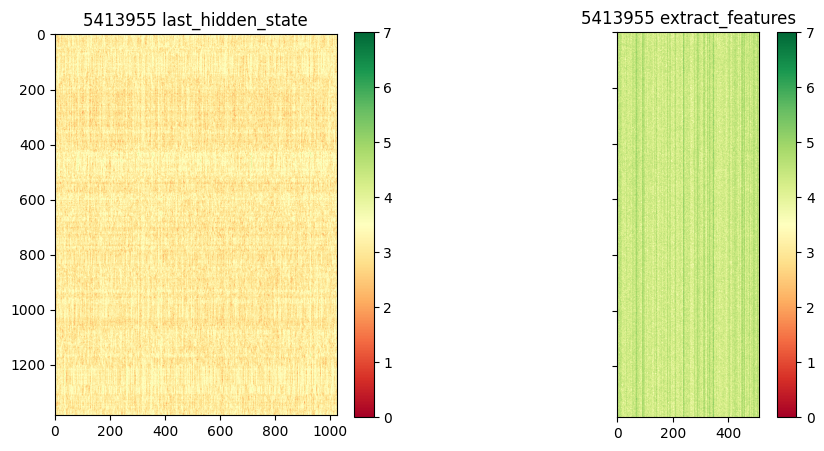

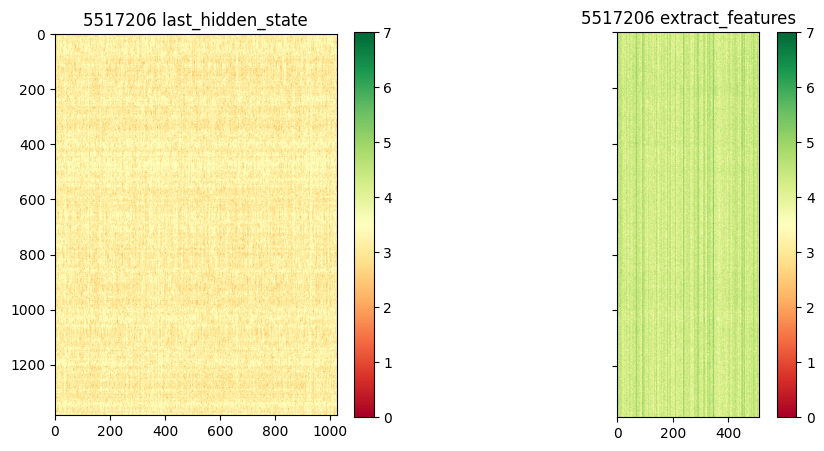

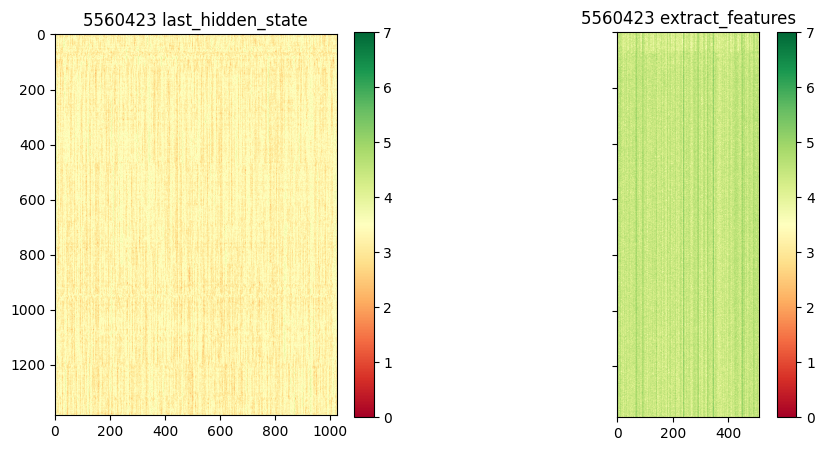

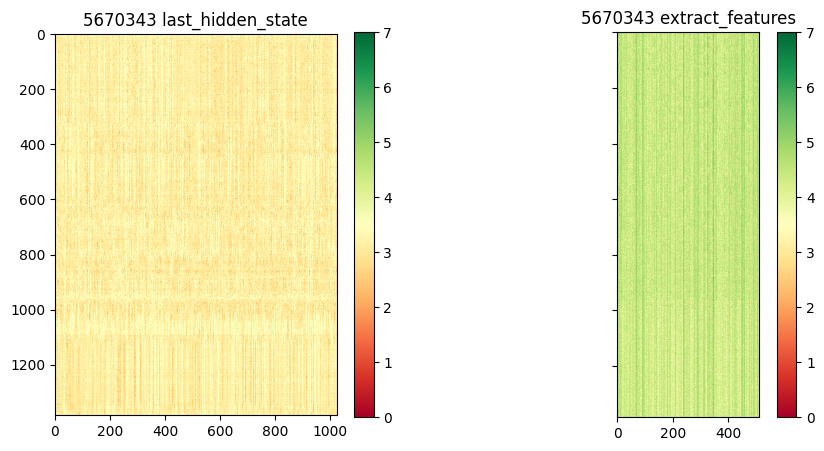

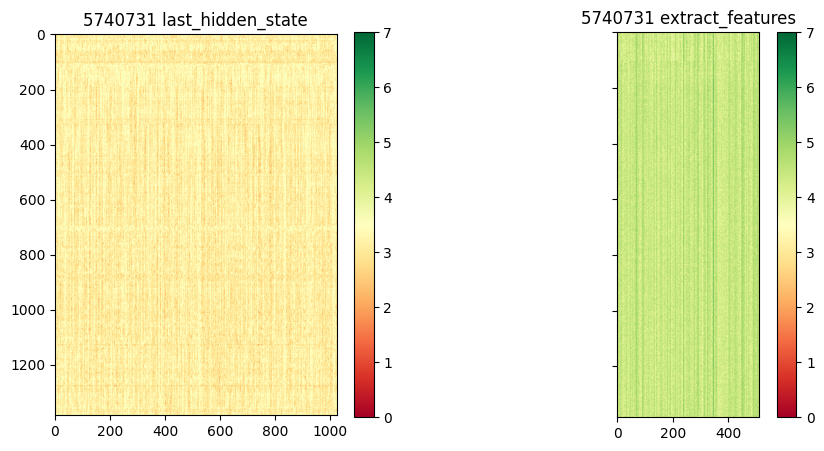

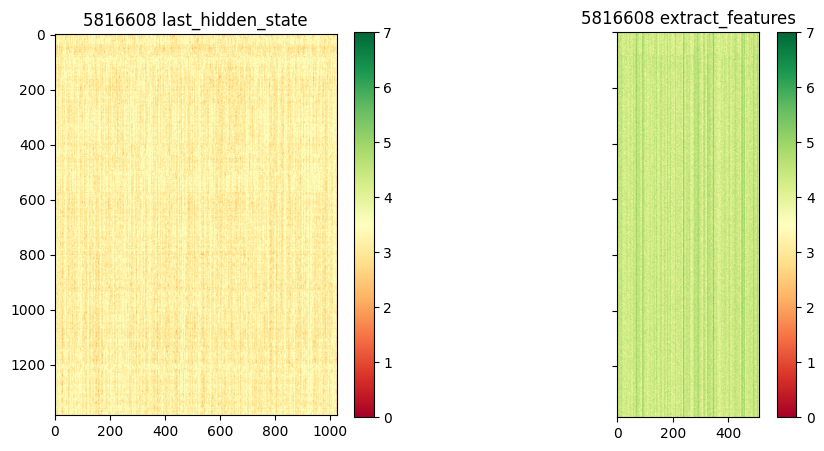

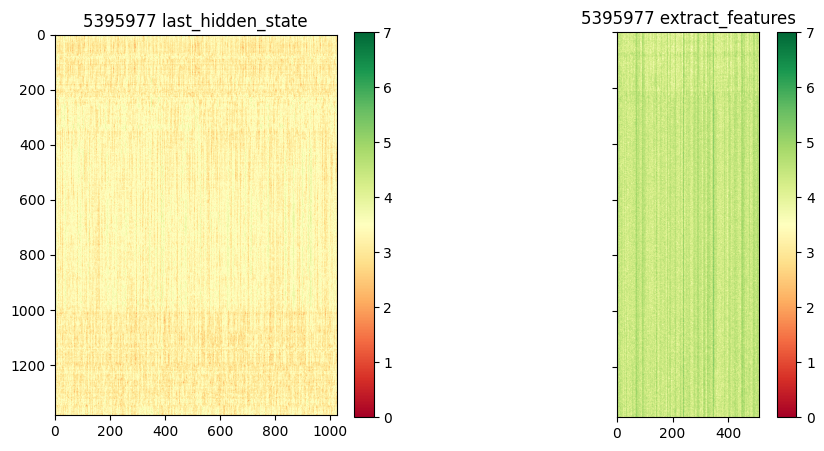

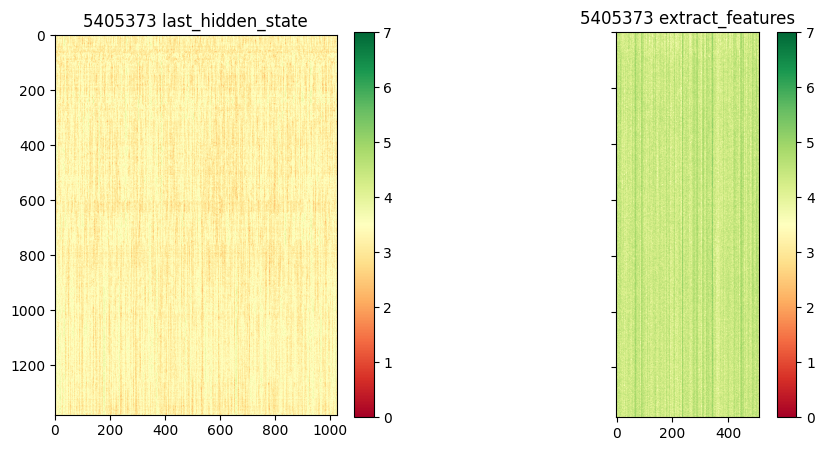

In [11]:
for sub in [ '5392123', '5404003', '5413955', '5517206', '5560423', '5670343', '5740731', '5816608', '5395977', '5405373']:

    print(f"\nSubject: {sub}")
    output = []
    embeddings = []
    outputs_last_hidden_state = []
    outputs_extract_features = []
    for iter in range(1,4):
        embeddings.append(pickle.load(open(f"embeddings/embeddings_verrou_sr_{iter}_{sub}.pkl", 'rb')))
        output.append(pickle.load(open(f"embeddings/output_verrou_sr_{iter}_{sub}.pkl", 'rb')))
        tmp = pickle.load(open(f"embeddings/wavlm_outputs_verrou_sr_{iter}_{sub}.pkl", 'rb'))
        outputs_last_hidden_state.append( tmp['last_hidden_state'] )
        outputs_extract_features.append( tmp['extract_features'] )

    output = torch.stack(output).squeeze()
    outputs_last_hidden_state = torch.stack(outputs_last_hidden_state).squeeze()
    outputs_extract_features = torch.stack(outputs_extract_features).squeeze()
    embeddings = torch.stack(embeddings).squeeze()
    # print(f"Pre-argmax output stdev: {output.std(dim=0)}, Pre-classifier embeddings stdev: {embeddings.std(dim=0).mean()}")
    embed_sig = sd.significant_digits(embeddings, reference=embeddings.mean(dim=0),  basis=10, error=Error.Relative)
    print(f"Significant digits output: {sd.significant_digits(output, reference=output.mean(dim=0),  basis=10, error=Error.Relative)}, Significant digits embeddings mean: {embed_sig.mean()} stdev: {embed_sig.std()}")


    fig, axes = plt.subplots(1,2, figsize=(10,5), sharey=True)
    im = axes[0].imshow(sd.significant_digits(outputs_last_hidden_state, reference=outputs_last_hidden_state.mean(dim=0),  basis=10, error=Error.Relative), cmap='RdYlGn', vmax=7, vmin=0 )
    axes[0].set_title(f'{sub} last_hidden_state')
    fig.colorbar(im, ax=axes[0])

    im = axes[1].imshow(sd.significant_digits(outputs_extract_features, reference=outputs_extract_features.mean(dim=0),  basis=10, error=Error.Relative), cmap='RdYlGn', vmax=7, vmin=0 )
    axes[1].set_title(f'{sub} extract_features');
    fig.colorbar(im, ax=axes[1]);
    # break

Output shape: torch.Size([1, 1, 2]), values: tensor([-0.7479,  0.7442])
Embeddings shape: torch.Size([1, 1, 192])
Wavlm last_hidden_state shape: torch.Size([1, 1382, 1024]) and Wavlm extract_features shape: torch.Size([1, 1382, 512])


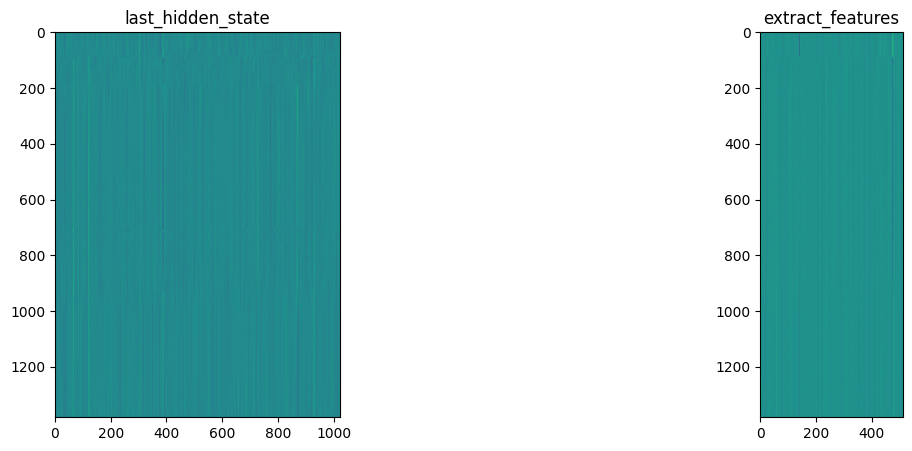

In [17]:
import transformers

embeddings = pickle.load(open(f"embeddings/embeddings_fuzzy_sr_1_5392123.pkl", 'rb'))
output = pickle.load(open(f"embeddings/output_fuzzy_sr_1_5392123.pkl", 'rb'))
outputs = pickle.load(open(f"embeddings/wavlm_outputs_fuzzy_sr_1_5392123.pkl", 'rb'))
print(f"Output shape: {output.shape}, values: {output.squeeze()}")
print(f"Embeddings shape: {embeddings.shape}")
print(f"Wavlm last_hidden_state shape: {outputs['last_hidden_state'].shape} and Wavlm extract_features shape: {outputs['extract_features'].shape}")

fig, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].imshow(outputs['last_hidden_state'].squeeze())
axes[0].set_title('last_hidden_state')
axes[1].imshow(outputs['extract_features'].squeeze())
axes[1].set_title('extract_features');

## Original Binary Metrics

In [15]:
base_path = Path('/scratch/ine5/fuzzy-pytorch/WavLM_Use_Case/output')

tools = ['verrou', 'fuzzy', 'ieee']
modes = ['sr', 'ud']
iters = range(1, 6)
subs = range(1, 49)

preds = {'ID': None}  # Will be filled once

for tool, mode in product(tools, modes):
    # This will collect predictions for each iteration under a unique column name
    for iter_num in iters:
        subject_ids = []
        predictions = []

        for sub in subs:
            if tool == 'ieee':
                file_path = base_path / f'{tool}_torch_{iter_num}_{sub}.out'
            elif tool == 'verrou':
                if mode == 'sr': file_path = base_path / f'{tool}_torch_{mode}_v2_{iter_num}_{sub}.out'
                else: file_path = base_path / f'{tool}_torch_{mode}_{iter_num}_{sub}.out'
            else:
                file_path = base_path / f'{tool}_torch_{mode}_{iter_num}_{sub}.out'

            try:
                with open(file_path, 'r') as f:
                    prev_line = None
                    for line in f:
                        if prev_line and prev_line.startswith("Subject ID:"):
                            subject_id = prev_line.split(":")[1].strip()
                            prediction = line.split(":")[1].strip()
                            subject_ids.append(subject_id)
                            predictions.append(prediction)
                        prev_line = line
            except FileNotFoundError:
                print(f"Missing: {file_path}")
            except Exception as e:
                print(f"Error reading {file_path}: {e}")

        # Set subject IDs only once
        if preds['ID'] is None:
            preds['ID'] = subject_ids

        # Add predictions under a new column for this iteration/tool/mode
        if tool == 'ieee':
            preds[f'{tool}_iter{iter_num}'] = predictions
        else:
            preds[f'{tool}_{mode}_iter{iter_num}'] = predictions

# Convert to DataFrame
df = pd.DataFrame(preds)

# df


In [8]:
base_path = Path('/scratch/ine5/fuzzy-pytorch/WavLM_Use_Case/static_output')

tools = ['verrou', 'fuzzy', 'ieee']
modes = ['sr', 'ud']
iters = range(1, 6)
subs = range(1, 68)

preds = {'ID': None}  # Will be filled once

for tool, mode in product(tools, modes):
    # This will collect predictions for each iteration under a unique column name
    for iter_num in iters:
        subject_ids = []
        predictions = []

        for sub in subs:
            if tool == 'ieee':
                file_path = base_path / f'{tool}_torch_{iter_num}_{sub}.out'
            else:
                file_path = base_path / f'{tool}_torch_{mode}_{iter_num}_{sub}.out'

            try:
                with open(file_path, 'r') as f:
                    # prev_line = None
                    for line in f:
                        if line and line.startswith("ID:"):
                            # print(line.split(":")[1].strip().split(',')[0].strip())
                            subject_id = line.split(":")[1].strip().split(',')[0].strip()
                            # print(line.split("Prediction:")[1].strip())
                            prediction = line.split("Prediction:")[1].strip().split(',')[0].strip()
                            # print(subject_id, prediction)
                            subject_ids.append(subject_id)
                            predictions.append(prediction)
                        prev_line = line
            except FileNotFoundError:
                print(f"Missing: {file_path}")
            except Exception as e:
                print(f"Error reading {file_path}: {e}")

        # Set subject IDs only once
        if preds['ID'] is None:
            preds['ID'] = subject_ids

        # Add predictions under a new column for this iteration/tool/mode
        if tool == 'ieee':
            preds[f'{tool}_iter{iter_num}'] = predictions
        else:
            preds[f'{tool}_{mode}_iter{iter_num}'] = predictions


# Convert to DataFrame
df = pd.DataFrame(preds)

# df


In [ ]:
df

,ID,verrou_sr_iter1,verrou_sr_iter2,verrou_sr_iter3,verrou_sr_iter4,verrou_sr_iter5,verrou_ud_iter1,verrou_ud_iter2,verrou_ud_iter3,verrou_ud_iter4,...,fuzzy_ud_iter1,fuzzy_ud_iter2,fuzzy_ud_iter3,fuzzy_ud_iter4,fuzzy_ud_iter5,ieee_iter1,ieee_iter2,ieee_iter3,ieee_iter4,ieee_iter5
0,5395675,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,5540620,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,5473776,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,5713377,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,6044197,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,5931797,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
63,5781515,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
64,5884447,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
65,5568881,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
# data = json.load(open(f'/scratch/ine5/fuzzy-pytorch/WavLM_Use_Case/test_annotation.json', 'r'))
data = json.load(open(f'/scratch/ine5/fuzzy-pytorch/WavLM_Use_Case/test.json', 'r'))
records = [
    {'ID': key, 'label': 1 if value['label'] == 'True' else 0}
    for key, value in data.items()
]
y_true = pd.DataFrame(records)
# y_true = y_true.astype({'ID': int})

result = pd.merge(y_true, df, on="ID")

In [10]:
tools = ['verrou', 'fuzzy', 'ieee']
modes = ['sr', 'ud']
iters = range(1, 6)

metrics = {'sr': {}, 'ud': {}}

for tool, mode in product(tools, modes):
    f1s, precisions, recalls, accuracies = [], [], [], []

    for iter_num in iters:
        if tool == 'ieee':
            preds = result[f'{tool}_iter{iter_num}'].astype(int)
        else:
            preds = result[f'{tool}_{mode}_iter{iter_num}'].astype(int)
        
        labels = result['label']
        f1 = f1_score(labels, preds, average='weighted')
        precision = precision_score(labels, preds, average='weighted')
        recall = recall_score(labels, preds, average='weighted')
        accuracy = accuracy_score(labels, preds)

        f1s.append(f1)
        precisions.append(precision)
        recalls.append(recall)
        accuracies.append(accuracy)

    # metrics[mode][tool] = {'Mean': [np.mean(f1s, dtype=np.float64), np.mean(precisions, dtype=np.float64), np.mean(recalls, dtype=np.float64), np.mean(accuracies, dtype=np.float64)], 
    #                        'Standard Deviation': [np.std(f1s, dtype=np.float64), np.std(precisions, dtype=np.float64), np.std(recalls, dtype=np.float64), np.std(accuracies, dtype=np.float64)],
    #                        'Significant Digits': [sd.significant_digits(np.array(f1s, dtype=np.float64), reference=np.mean(f1s, axis=0, dtype=np.float64),  basis=10, error=Error.Relative), sd.significant_digits(np.array(precisions, dtype=np.float64), reference=np.mean(precisions, axis=0, dtype=np.float64),  basis=10, error=Error.Relative),
    #                                               sd.significant_digits(np.array(recalls, dtype=np.float64), reference=np.mean(np.array(recalls, dtype=np.float64), axis=0, dtype=np.float64),  basis=10, error=Error.Relative), sd.significant_digits(np.array(accuracies, dtype=np.float64), reference=np.mean(accuracies, axis=0, dtype=np.float64),  basis=10, error=Error.Relative) ] }

    metrics[mode][tool] = {'Mean': [np.mean(f1s, dtype=np.float64), np.mean(precisions, dtype=np.float32), np.mean(recalls, dtype=np.float32), np.mean(accuracies, dtype=np.float32)], 
                           'Standard Deviation': [np.std(f1s, dtype=np.float32), np.std(precisions, dtype=np.float32), np.std(recalls, dtype=np.float32), np.std(accuracies, dtype=np.float32)],
                           'Significant Digits': [sd.significant_digits(np.array(f1s, dtype=np.float32), reference=np.mean(f1s, axis=0, dtype=np.float32),  basis=10, error=Error.Relative), sd.significant_digits(np.array(precisions, dtype=np.float32), reference=np.mean(precisions, axis=0, dtype=np.float32),  basis=10, error=Error.Relative),
                                                  sd.significant_digits(np.array(recalls, dtype=np.float32), reference=np.mean(np.array(recalls, dtype=np.float32), axis=0, dtype=np.float32),  basis=10, error=Error.Relative), sd.significant_digits(np.array(accuracies, dtype=np.float32), reference=np.mean(accuracies, axis=0, dtype=np.float32),  basis=10, error=Error.Relative) ] }


    print(f"{tool} {mode} AVERAGE F1 Score       : {np.mean(f1s, dtype=np.float64):.4f} ± {np.std(f1s, dtype=np.float64):.4e}")
    print(f"{tool} {mode} AVERAGE Precision Score: {np.mean(precisions, dtype=np.float64):.4f} ± {np.std(precisions, dtype=np.float64):.4e}")
    print(f"{tool} {mode} AVERAGE Recall Score   : {np.mean(recalls, dtype=np.float64):.4f} ± {np.std(recalls, dtype=np.float64):.4e}")
    print(f"{tool} {mode} AVERAGE Accuracy Score : {np.mean(accuracies, dtype=np.float64):.4f} ± {np.std(accuracies, dtype=np.float64):.4e}")
    print("=" * 60)


verrou sr AVERAGE F1 Score       : 0.5522 ± 0.0000e+00
verrou sr AVERAGE Precision Score: 0.5522 ± 0.0000e+00
verrou sr AVERAGE Recall Score   : 0.5522 ± 0.0000e+00
verrou sr AVERAGE Accuracy Score : 0.5522 ± 0.0000e+00
verrou ud AVERAGE F1 Score       : 0.5522 ± 0.0000e+00
verrou ud AVERAGE Precision Score: 0.5522 ± 0.0000e+00
verrou ud AVERAGE Recall Score   : 0.5522 ± 0.0000e+00
verrou ud AVERAGE Accuracy Score : 0.5522 ± 0.0000e+00
fuzzy sr AVERAGE F1 Score       : 0.5522 ± 0.0000e+00
fuzzy sr AVERAGE Precision Score: 0.5522 ± 0.0000e+00
fuzzy sr AVERAGE Recall Score   : 0.5522 ± 0.0000e+00
fuzzy sr AVERAGE Accuracy Score : 0.5522 ± 0.0000e+00
fuzzy ud AVERAGE F1 Score       : 0.5522 ± 0.0000e+00
fuzzy ud AVERAGE Precision Score: 0.5522 ± 0.0000e+00
fuzzy ud AVERAGE Recall Score   : 0.5522 ± 0.0000e+00
fuzzy ud AVERAGE Accuracy Score : 0.5522 ± 0.0000e+00
ieee sr AVERAGE F1 Score       : 0.5522 ± 0.0000e+00
ieee sr AVERAGE Precision Score: 0.5522 ± 0.0000e+00
ieee sr AVERAGE Recall

In [11]:
tools = ['verrou', 'fuzzy']
modes = ['sr', 'ud']
metric_names = ['F1', 'Precision', 'Recall', 'Accuracy']
bar_width = 0.2

# Build flattened DataFrame
data = []

for metric in metric_names:
    for mode, tool in product(['ud', 'sr'], ['fuzzy', 'verrou']):
        sig = metrics[mode][tool]['Significant Digits'][metric_names.index(metric)]
        if tool == 'verrou' and mode == 'ud': mode='CESTAC'

        data.append({
            'Metric': metric,
            'Tool': tool.title(),
            'Mode': mode.upper(),
            'Tool_Mode': f'{tool.title()} {mode.upper()}',
            'Significant Digits': sig
        })

df = pd.DataFrame(data)

# Get unique tool-mode combinations
tool_modes = df['Tool_Mode'].unique()
x_categories = metric_names

# Create grouped bar traces
fig = go.Figure()

for tm in tool_modes:
    tool, mode = tm.split(' ')
    df_tm = df[df['Tool_Mode'] == tm]

    # Set color and pattern
    if tool == 'Verrou':
        color = px.colors.qualitative.Plotly[4] 
    else: color = px.colors.qualitative.Plotly[0]
    pattern_shape = '/' if mode == 'UD' or mode == 'CESTAC' else ''
    
    fig.add_trace(go.Bar(
        name=tm,
        x=df_tm['Metric'],
        y=df_tm['Significant Digits'],
        marker=dict(
            color=color,
            pattern=dict(
                shape=pattern_shape,
                fillmode='overlay',
                size=10
            )
        )
    ))


# Set axis labels and layout
fig.update_layout(
    width=800,
    height=500,
    margin=dict(l=10, r=10, t=30, b=10),  # Tight margins

    xaxis=dict(
        title='Metric',
        title_font=dict(size=24),
        tickfont=dict(size=22),
    ),
    yaxis=dict(
        title='Significant Digits',
        title_font=dict(size=24),
        tickfont=dict(size=22),
        range=[0.0, 7.01]
    ),
    
    legend=dict(
        font=dict(size=24),
        orientation='h',  
        yanchor='bottom',  
        xanchor='center',  
        y=1.0,
        x=0.5
    ),

    barmode='group',
    font=dict(size=22)  # General fallback font size
)

# fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
# fig.write_image('/scratch/ine5/fuzzy-pytorch/WavLM_Use_Case/wavlm_sig_metrics.pdf', engine="kaleido", format='pdf')
fig.write_image('/scratch/ine5/fuzzy-pytorch/WavLM_Use_Case/wavlm_sig_metrics.svg', engine="kaleido")

fig.show()


## Output Prior to Argmax Predictions

In [3]:
from concurrent.futures import ThreadPoolExecutor

# Optional: Replace with NumPy if you want to fully remove torch dependency
# def to_np(tensor):
#     return tensor.numpy()

# Subject list
# subjects = [
#     '5392123', '5404003', '5413955', '5517206', '5560423', '5670343', '5740731', '5816608', '5395977',
#     '5405373', '5462373', '5529554', '5601854', '5672724', '5780927', '5872338', '5399183', '5406365',
#     '5467142', '5532681', '5602887', '5678058', '5794627', '5889379', '5399357', '5406647', '5470602',
#     '5533888', '5629808', '5682809', '5811465', '5908709', '5399995', '5407900', '5486319', '5543701',
#     '5632285', '5727192', '5811688', '5938156', '5400240', '5408796', '5487434', '5556999', '5658129',
#     '5733738', '5813444', '6024134'
# ]

subjects = ['5395675', '5540620', '5473776', '5713377', '6044197', '6023682', '5593380', '6006405', '5801628', '5965463', '5890374', '5809299', '5762345', '5824259', '5439390', '5492841', '5905392',
            '5822338', '5561646', '5933409', '5610075', '5888115', '5945096', '5649136', '5670303', '5833952', '5935026', '6028564', '5441506', '5983944', '5747486', '5946889', '5566601', '5976949',
            '5403980', '5714015', '5466129', '5408212', '5869483', '5402792', '5453241', '5872967', '5531834', '5890300', '5396986', '5569833', '5413312', '5763007', '5887447', '5757752', '5715968',
            '5404958', '5788655', '5893493', '5837015', '5534714', '5781428', '5772616', '5934501', '5962426', '5962276', '5631826', '5931797', '5781515', '5884447', '5568881', '5405698', '5535312']


output_sub_sig = {}
output_sub_mean = {}
output_sub_std = {}
embeddings_sub = {}

def load_pair(tool, mode, iter, sub):
    if tool == 'verrou':
        e_path = f"embeddings/embeddings_{tool}_{mode}_{iter}_{sub}.pkl"
        o_path = f"embeddings/output_{tool}_{mode}_{iter}_{sub}.pkl"
    else: 
        o_path = f"static_embeddings/output_{tool}_{mode}_{iter}_{sub}.pkl"
        e_path = f"static_embeddings/embeddings_{tool}_{mode}_{iter}_{sub}.pkl"
    with open(e_path, 'rb') as f1, open(o_path, 'rb') as f2:
    # with open(o_path, 'rb') as f2:
        return pickle.load(f1), pickle.load(f2)

# Loop through mode and tool combinations
for mode, tool in product(['sr', 'ud'], ['fuzzy', 'verrou']):
# for mode, tool in product(['sr', 'ud'], ['fuzzy']):
    output_sub_sig[mode] = output_sub_sig.get(mode, {})
    output_sub_mean[mode] = output_sub_mean.get(mode, {})
    output_sub_std[mode] = output_sub_std.get(mode, {})
    embeddings_sub[mode] = embeddings_sub.get(mode, {})

    sig_list = []
    mean_list = []
    std_list = []
    emb_sig_list = []

    for sub in subjects:
        # Parallel loading of 5 iterations
        with ThreadPoolExecutor(max_workers=5) as executor:
            results = list(executor.map(lambda i: load_pair(tool, mode, i, sub), range(1, 6)))

        embeddings, outputs = zip(*results)
        embeddings = np.stack(embeddings).squeeze()
        outputs = np.stack(outputs).squeeze()
        # outputs = np.stack(results).squeeze()

        # Precompute means
        output_mean = outputs.mean(axis=0)
        embeddings_mean = embeddings.mean(axis=0)

        # Compute significant digits (Torch or NumPy)
        output_sig = sd.significant_digits(outputs, reference=output_mean, basis=10, error=Error.Relative)
        embed_sig = sd.significant_digits(embeddings, reference=embeddings_mean, basis=10, error=Error.Relative)

        # Append results
        sig_list.append(output_sig)
        mean_list.append(output_mean)
        std_list.append(outputs.std(axis=0))
        emb_sig_list.append(embed_sig)

    # Final stacking and conversion
    output_sub_sig[mode][tool] = np.array(sig_list) #.numpy()
    output_sub_mean[mode][tool] = np.stack(mean_list) #.numpy()
    output_sub_std[mode][tool] = np.stack(std_list) #.numpy()
    embeddings_sub[mode][tool] = emb_sig_list #.numpy()


sr verrou 3.8725249720646 0.5414001282388377
sr fuzzy 4.103102832049957 0.5130365406560221
sr verrou 3.831232104642682 0.5292093279313717
sr fuzzy 4.089169900343353 0.580757605672509
ud verrou 3.7497445308853834 0.49807655581549776
ud fuzzy 3.288124933331159 0.5066318551341286
ud verrou 3.748617421000225 0.5314274153734785
ud fuzzy 3.254033041907988 0.5672917694519892


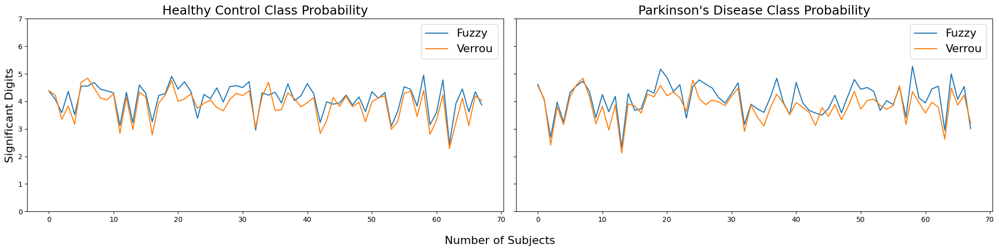

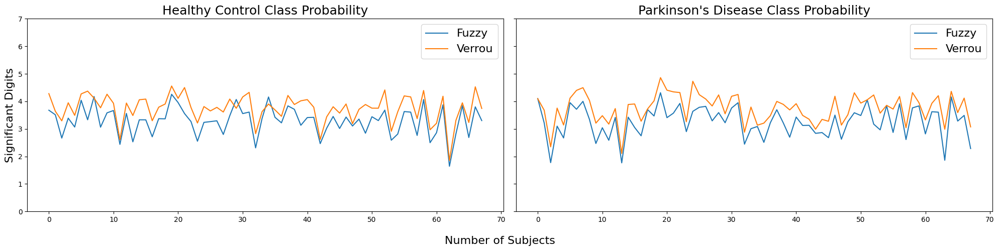

In [4]:
for mode in ['sr', 'ud']:
    fig, axes = plt.subplots(1,2, figsize=(20,5), sharey=True)

    for num in range(len(axes)):
        print(f"{mode} verrou {output_sub_sig[mode]['verrou'][:,num].mean()} {output_sub_sig[mode]['verrou'][:,num].std()}")
        print(f"{mode} fuzzy {output_sub_sig[mode]['fuzzy'][:,num].mean()} {output_sub_sig[mode]['fuzzy'][:,num].std()}")
        axes[num].plot(output_sub_sig[mode]['fuzzy'][:,num], label='Fuzzy')
        axes[num].plot(output_sub_sig[mode]['verrou'][:,num], label='Verrou')
        if num == 0:
            axes[num].set_title(f'Healthy Control Class Probability', fontsize=18)
        else:
            axes[num].set_title(f"Parkinson's Disease Class Probability", fontsize=18)
        axes[num].legend(fontsize=16), axes[num].set_ylim(0,7)
    fig.supxlabel('Number of Subjects', fontsize=16)
    axes[0].set_ylabel('Significant Digits', fontsize=16)
    # fig.suptitle(f'Significant Digits ({mode.upper()} Mode)', fontsize=18)
    plt.tight_layout()
    plt.savefig(f'/scratch/ine5/fuzzy-pytorch/WavLM_Use_Case/wavlm_output_prob_{mode}.pdf')


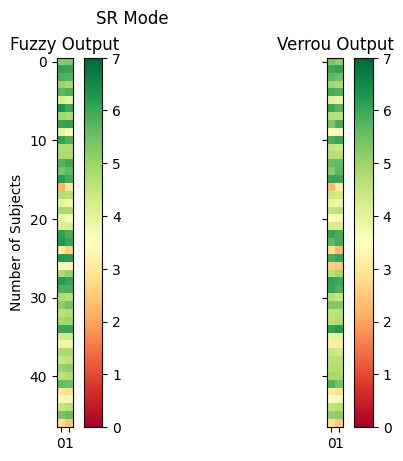

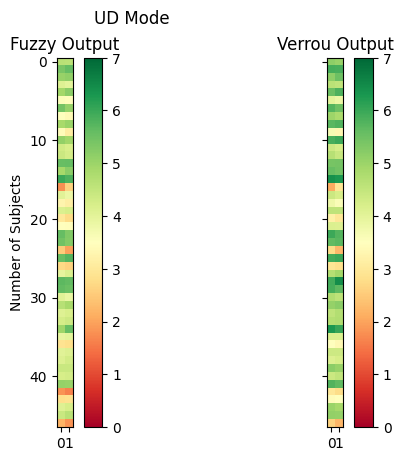

In [18]:
for mode in ['sr', 'ud']:

    fig, axes = plt.subplots(1,2, sharey=True)
    im = axes[0].imshow(output_sub_sig[mode]['fuzzy'], cmap='RdYlGn', vmax=7, vmin=0)
    axes[0].set_title(f'Fuzzy Output')
    axes[0].set_ylabel('Number of Subjects')
    fig.colorbar(im, ax=axes[0])

    im = axes[1].imshow(output_sub_sig[mode]['verrou'], cmap='RdYlGn', vmax=7, vmin=0)
    axes[1].set_title(f'Verrou Output')
    fig.colorbar(im, ax=axes[1])
    fig.suptitle(f"{mode.upper()} Mode");

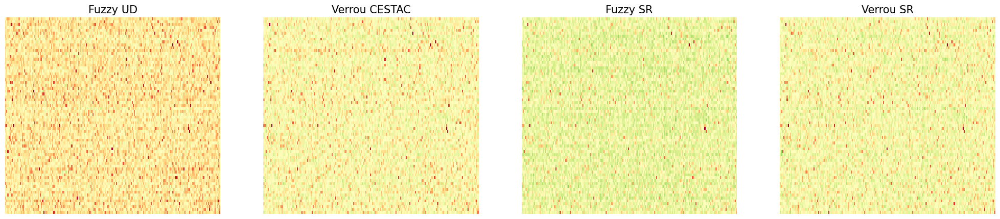

In [5]:
fig, axes = plt.subplots(1,4, figsize=(25,5), sharey=True)
num = 0
for mode, tool in product(['ud', 'sr'], ['fuzzy', 'verrou']):
    gc = sns.heatmap(embeddings_sub[mode][tool], ax=axes[num], vmin=0, vmax=7, cmap='RdYlGn', cbar=False)
    gc.set_yticks([]), gc.set_xticks([])
    
    if tool == 'verrou' and mode =='ud': 
        gc.set_title(f'{tool.title()} CESTAC', fontsize=15)
    else:
        gc.set_title(f'{tool.title()} {mode.upper()}', fontsize=15)
    # axes[num].set_ylabel('Number of Subjects')
    num += 1
plt.savefig('/scratch/ine5/fuzzy-pytorch/WavLM_Use_Case/wavlm_embeddings.pdf', bbox_inches='tight');

## Runtime

In [2]:
runtime_wavlm = defaultdict(lambda: defaultdict(lambda: defaultdict(list)))

# Predefine constants
modes = ['sr', 'ud']
tools = ['fuzzy', 'verrou']
# subjects = ['5392123', '5404003', '5413955', '5517206', '5560423', '5670343', '5740731', '5816608', '5395977' , '5405373', '5462373', '5529554', '5601854', '5672724', '5780927', '5872338', '5399183', 
#                     '5406365', '5467142', '5532681', '5602887', '5678058', '5794627', '5889379', '5399357', '5406647', '5470602', '5533888', '5629808', '5682809', '5811465', '5908709', '5399995', '5407900', 
#                     '5486319', '5543701', '5632285', '5727192', '5811688', '5938156', '5400240', '5408796', '5487434', '5556999', '5658129', '5733738', '5813444', '6024134']

subjects = ['5395675', '5540620', '5473776', '5713377', '6044197', '6023682', '5593380', '6006405', '5801628', '5965463', '5890374', '5809299', '5762345', '5824259', '5439390', '5492841', '5905392',
                    '5822338', '5561646', '5933409', '5610075', '5888115', '5945096', '5649136', '5670303', '5833952', '5935026', '6028564', '5441506', '5983944', '5747486', '5946889', '5566601', '5976949',
                    '5403980', '5714015', '5466129', '5408212', '5869483', '5402792', '5453241', '5872967', '5531834', '5890300', '5396986', '5569833', '5413312', '5763007', '5887447', '5757752', '5715968',
                    '5404958', '5788655', '5893493', '5837015', '5534714', '5781428', '5772616', '5934501', '5962426', '5962276', '5631826', '5931797', '5781515', '5884447', '5568881', '5405698', '5535312']

time_pattern = re.compile(r"^user\s+(\d+)m([\d.]+)s")

# Flatten iteration using product
for mode, tool, (num, sub), iter in product(modes, tools, enumerate(subjects), range(1, 6)):
    # filepath = f"/home/ine5/scratch/fuzzy-pytorch/WavLM_Use_Case/output/{tool}_torch_{mode}_{iter}_{num+1}.out"
    filepath = f"/home/ine5/scratch/fuzzy-pytorch/WavLM_Use_Case/static_output/{tool}_torch_{mode}_{iter}_{num+1}.out"
    
    if not os.path.exists(filepath):
        print(f"Missing file: {filepath}")
        continue

    with open(filepath) as f:
        for line in f:
            match = time_pattern.search(line)
            if match:
                minutes = int(match.group(1))
                seconds = float(match.group(2))
                total_seconds = minutes * 60 + seconds
                runtime_wavlm[mode][tool][sub].append(total_seconds)
                break  # Only grab the first 'real' line
        else:
            print(f"No match found in: {filepath}")


In [6]:
runtime_wavlm_ieee = defaultdict(list)


# Predefine constants
# subjects = ['5392123', '5404003', '5413955', '5517206', '5560423', '5670343', '5740731', '5816608', '5395977' , '5405373', '5462373', '5529554', '5601854', '5672724', '5780927', '5872338', '5399183', 
#                     '5406365', '5467142', '5532681', '5602887', '5678058', '5794627', '5889379', '5399357', '5406647', '5470602', '5533888', '5629808', '5682809', '5811465', '5908709', '5399995', '5407900', 
#                     '5486319', '5543701', '5632285', '5727192', '5811688', '5938156', '5400240', '5408796', '5487434', '5556999', '5658129', '5733738', '5813444', '6024134']

subjects = ['5395675', '5540620', '5473776', '5713377', '6044197', '6023682', '5593380', '6006405', '5801628', '5965463', '5890374', '5809299', '5762345', '5824259', '5439390', '5492841', '5905392',
                    '5822338', '5561646', '5933409', '5610075', '5888115', '5945096', '5649136', '5670303', '5833952', '5935026', '6028564', '5441506', '5983944', '5747486', '5946889', '5566601', '5976949',
                    '5403980', '5714015', '5466129', '5408212', '5869483', '5402792', '5453241', '5872967', '5531834', '5890300', '5396986', '5569833', '5413312', '5763007', '5887447', '5757752', '5715968',
                    '5404958', '5788655', '5893493', '5837015', '5534714', '5781428', '5772616', '5934501', '5962426', '5962276', '5631826', '5931797', '5781515', '5884447', '5568881', '5405698', '5535312']

time_pattern = re.compile(r"^user\s+(\d+)m([\d.]+)s")

# Flatten iteration using product
for (num, sub), iter in product(enumerate(subjects), range(1, 6)):
    filepath = f"/home/ine5/scratch/fuzzy-pytorch/WavLM_Use_Case/static_output/ieee_torch_{iter}_{num+1}.out"
    
    if not os.path.exists(filepath):
        print(f"Missing file: {filepath}")
        continue

    with open(filepath) as f:
        for line in f:
            match = time_pattern.search(line)
            if match:
                minutes = int(match.group(1))
                seconds = float(match.group(2))
                total_seconds = minutes * 60 + seconds
                runtime_wavlm_ieee[sub].append(total_seconds)
                break  # Only grab the first 'real' line
        else:
            print(f"No match found in: {filepath}")


In [7]:
df_runtime = {}
for mode, tool in product(['sr', 'ud'], ['fuzzy', 'verrou']):
    df_runtime[f"{tool} {mode.upper()}"] = np.array(list(runtime_wavlm[mode][tool].values())).mean(axis=0)
        
    # print(np.array(list(runtime_wavlm[mode][tool].values())).shape )
    # break

verrou_ud_ratio = [(v/f) for v,f in zip(df_runtime['verrou UD'], df_runtime['fuzzy UD'])]
verrou_sr_ratio = [(v/f) for v,f in zip(df_runtime['verrou SR'], df_runtime['fuzzy SR'])]


df_runtime['IEEE'] = np.array(list(runtime_wavlm_ieee.values())).mean(axis=0)
df_runtime["Fuzzy UD Speed Up Factor from Verrou"] = verrou_ud_ratio
df_runtime["Fuzzy SR Speed Up Factor from Verrou"] = verrou_sr_ratio

In [8]:
df_runtime = pd.DataFrame(df_runtime)
df_runtime = df_runtime.rename(index={0: 'MCA Iteration 1', 1: 'MCA Iteration 2', 2: 'MCA Iteration 3', 3: 'MCA Iteration 4', 4: 'MCA Iteration 5'})
df_runtime

,fuzzy SR,verrou SR,fuzzy UD,verrou UD,IEEE,Fuzzy UD Speed Up Factor from Verrou,Fuzzy SR Speed Up Factor from Verrou
MCA Iteration 1,806.572147,6363.774147,971.305647,5561.459059,14.795603,5.725756,7.889901
MCA Iteration 2,823.294574,6377.595882,1012.366588,5565.301765,15.002853,5.497319,7.746433
MCA Iteration 3,792.498294,6411.189309,985.904088,5485.011676,15.716309,5.563433,8.089846
MCA Iteration 4,824.231706,6374.153147,933.744765,5552.526132,15.473485,5.946514,7.733448
MCA Iteration 5,801.550926,6406.743015,1001.324794,5550.982765,15.198544,5.543639,7.992933


In [20]:
df_runtime['verrou SR'].std()

21.019939932382872

In [35]:
df_runtime = pd.DataFrame(df_runtime)
df_runtime = df_runtime.rename(index={0: 'MCA Iteration 1', 1: 'MCA Iteration 2', 2: 'MCA Iteration 3', 3: 'MCA Iteration 4', 4: 'MCA Iteration 5'})
df_runtime

,fuzzy SR,verrou SR,fuzzy UD,verrou UD,IEEE,"""Fuzzy UD Speed Up Factor from Verrou""","""Fuzzy SR Speed Up Factor from Verrou"""
MCA Iteration 1,4829.671792,20060.455979,3649.241813,17203.989667,93.498021,4.714401,4.153586
MCA Iteration 2,4842.591583,19767.236875,3631.257396,17423.717896,71.925937,4.798260,4.081954
MCA Iteration 3,4909.450687,19838.388958,3595.245812,17212.735396,62.056250,4.787638,4.040857
MCA Iteration 4,4973.816896,19700.216354,3583.850979,16780.525354,65.132917,4.682261,3.960784
MCA Iteration 5,4922.464500,19768.134187,3697.886021,17127.049646,86.654063,4.631579,4.015902
